In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras import layers, models, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Sequence

In [3]:
%pip install transformers

     ---------------------------------------- 0.0/42.2 kB ? eta -:--:--
     ------------------ ------------------- 20.5/42.2 kB 330.3 kB/s eta 0:00:01
     -------------------------------------- 42.2/42.2 kB 409.4 kB/s eta 0:00:00
  Using cached PyYAML-6.0.2-cp311-cp311-win_amd64.whl.metadata (2.1 kB)
     ---------------------------------------- 0.0/41.5 kB ? eta -:--:--
     ---------------------------------------- 41.5/41.5 kB 2.0 MB/s eta 0:00:00
  Using cached safetensors-0.6.2-cp38-abi3-win_amd64.whl.metadata (4.1 kB)
   ---------------------------------------- 0.0/11.6 MB ? eta -:--:--
   ---------------------------------------- 0.1/11.6 MB 2.8 MB/s eta 0:00:05
    --------------------------------------- 0.3/11.6 MB 2.6 MB/s eta 0:00:05
   - -------------------------------------- 0.3/11.6 MB 2.4 MB/s eta 0:00:05
   - -------------------------------------- 0.3/11.6 MB 2.4 MB/s eta 0:00:05
   -- ------------------------------------- 0.6/11.6 MB 2.4 MB/s eta 0:00:05
   -- --------


[notice] A new release of pip is available: 24.0 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
from transformers import TFViTModel, ViTConfig

c:\Users\Lenovo\Desktop\Exploration-of-ViT-and-CNN-for-Medical-Image-Processing\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
data_dir = r"C:\Users\Lenovo\Desktop\Exploration-of-ViT-and-CNN-for-Medical-Image-Processing\data\processed\segmentation\acute_lymphoblastic_leukemia_ALL"

# Check if path exists
if os.path.exists(data_dir):
    print("✅ Path exists:", data_dir)
    # List subdirectories (e.g., train, test, val)
    print("Subdirectories:", os.listdir(data_dir))
else:
    print("❌ Path not found!")

✅ Path exists: C:\Users\Lenovo\Desktop\Exploration-of-ViT-and-CNN-for-Medical-Image-Processing\data\processed\segmentation\acute_lymphoblastic_leukemia_ALL
Subdirectories: ['test', 'train', 'validation']


In [6]:
splits = ["train", "validation", "test"]
subtypes = ["Original", "Segmented"]

# Count images
for split in splits:
    print(f"\n📂 {split.upper()} set:")
    for subtype in subtypes:
        subtype_path = os.path.join(data_dir, split, subtype)
        if os.path.exists(subtype_path):
            print(f"  {subtype}:")
            for cls in os.listdir(subtype_path):
                class_path = os.path.join(subtype_path, cls)
                if os.path.isdir(class_path):
                    num_images = len([f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
                    print(f"    {cls}: {num_images} images")
        else:
            print(f"  ⚠️ {subtype} folder not found in {split}")


📂 TRAIN set:
  Original:
    Benign: 352 images
    Early: 689 images
    Pre: 674 images
    Pro: 562 images
  Segmented:
    Benign: 352 images
    Early: 689 images
    Pre: 674 images
    Pro: 562 images

📂 VALIDATION set:
  Original:
    Benign: 76 images
    Early: 148 images
    Pre: 144 images
    Pro: 121 images
  Segmented:
    Benign: 76 images
    Early: 148 images
    Pre: 144 images
    Pro: 121 images

📂 TEST set:
  Original:
    Benign: 76 images
    Early: 148 images
    Pre: 145 images
    Pro: 121 images
  Segmented:
    Benign: 76 images
    Early: 148 images
    Pre: 145 images
    Pro: 121 images


In [7]:
counts = {
    "train": {"Benign": 352, "Early": 689, "Pre": 674, "Pro": 562},
    "validation": {"Benign": 76, "Early": 148, "Pre": 144, "Pro": 121},
    "test": {"Benign": 76, "Early": 148, "Pre": 145, "Pro": 121}
}


split_totals = {split: sum(class_counts.values()) for split, class_counts in counts.items()}
grand_total = sum(split_totals.values())

for split, total in split_totals.items():
    print(f"{split.capitalize()} total: {total} images")

print(f"\n📊 Grand Total: {grand_total} images")


Train total: 2277 images
Validation total: 489 images
Test total: 490 images

📊 Grand Total: 3256 images


In [8]:
%pip install mplcyberpunk

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [9]:
# Paths
train_original = os.path.join(data_dir, "train", "Original")
train_segmented = os.path.join(data_dir, "train", "Segmented")

| Part       | CNN U-Net                                | ViT U-Net (V-UNet)                       |
| ---------- | ---------------------------------------- | ---------------------------------------- |
| Encoder    | Conv2D + pooling, deep hierarchy         | Transformer blocks, fewer layers         |
| Context    | Builds up gradually (local → global)     | Direct global context via self-attention |
| Decoder    | Mirrors depth with many skip connections | Shallower, fewer stages                  |
| Parameters | High (millions of conv weights)          | Lower (attention + projection weights)   |
| Advantage  | Strong for local textures                | Strong for global dependencies           |


⚖️ For the research

CNN U-Net (baseline): Great for benchmarking.

ViT-U-Net hybrid: Shows how transformers improve segmentation with global reasoning.

Pure ViT: Possible, but very impractical here (would likely underperform or overfit on your dataset).

👉 So for "Exploration of CNN vs ViT in medical image processing," it’s scientifically stronger to use CNN U-Net vs ViT-hybrid U-Net.

In [81]:
import tensorflow as tf

def iou_metric(y_true, y_pred, smooth=1e-6):
    # Continuous IoU
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

def dice_coefficient(y_true, y_pred, smooth=1e-6):
    # Continuous Dice
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)



In [82]:
import tensorflow as tf
from tensorflow.keras import layers, models, Input
from tensorflow.keras.optimizers import Adam

# Patch Embedding Layer
class PatchEmbedding(layers.Layer):
    def __init__(self, patch_size=16, embed_dim=512):
        super().__init__()
        self.patch_size = patch_size
        self.projection = layers.Conv2D(embed_dim, kernel_size=patch_size, strides=patch_size)
        self.flatten = layers.Reshape((-1, embed_dim))

    def call(self, x):
        x = self.projection(x)
        return self.flatten(x)

# Transformer Block
def transformer_block(x, embed_dim, num_heads, mlp_dim):
    attn = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim)(x, x)
    x = layers.Add()([x, attn])
    x = layers.LayerNormalization()(x)

    mlp = layers.Dense(mlp_dim, activation="relu")(x)
    mlp = layers.Dense(embed_dim)(mlp)
    x = layers.Add()([x, mlp])
    return layers.LayerNormalization()(x)


# 🧩 Vision Transformer U-Net

In [101]:
# ViT-U-Net
def vit_unet(input_size=(128,128,3), num_classes=1, patch_size=16, embed_dim=512,
             num_heads=8, num_layers=12, mlp_dim=1024):
    inputs = Input(shape=input_size)

    # --- Encoder ---
    # Patch embedding
    patch_embed = PatchEmbedding(patch_size=patch_size, embed_dim=embed_dim)(inputs)

    # Transformer blocks
    x = patch_embed
    for _ in range(num_layers):
        x = transformer_block(x, embed_dim, num_heads, mlp_dim)

    # Reshape transformer output back into 2D
    h = input_size[0] // patch_size
    w = input_size[1] // patch_size
    x = layers.Reshape((h, w, embed_dim))(x)

    # --- Skip connections (like U-Net) ---
    # Early low-level features
    skip1 = layers.Conv2D(64, (3,3), padding="same", activation="relu")(inputs)   # 128x128
    skip1 = layers.MaxPooling2D((2,2))(skip1)                                     # 64x64

    skip2 = layers.Conv2D(128, (3,3), padding="same", activation="relu")(skip1)   # 64x64
    skip2 = layers.MaxPooling2D((2,2))(skip2)                                     # 32x32

    skip3 = layers.Conv2D(256, (3,3), padding="same", activation="relu")(skip2)   # 32x32
    skip3 = layers.MaxPooling2D((2,2))(skip3)                                     # 16x16

    # Now transformer output is (8x8xembed_dim)
    # Decoder with skip connections
    x = layers.Conv2DTranspose(256, (3,3), strides=(2,2), padding="same", activation="relu")(x)  # 16x16
    x = layers.Concatenate()([x, skip3])

    x = layers.Conv2DTranspose(128, (3,3), strides=(2,2), padding="same", activation="relu")(x)  # 32x32
    x = layers.Concatenate()([x, skip2])

    x = layers.Conv2DTranspose(64, (3,3), strides=(2,2), padding="same", activation="relu")(x)   # 64x64
    x = layers.Concatenate()([x, skip1])

    x = layers.Conv2DTranspose(32, (3,3), strides=(2,2), padding="same", activation="relu")(x)   # 128x128

    
    # --- Output ---
    outputs = layers.Conv2D(num_classes, (1,1), activation="sigmoid")(x)

    model = models.Model(inputs, outputs)
    return model


In [102]:
def bce_dice_loss(y_true, y_pred, alpha=0.3, beta=0.7):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    dice = 1 - dice_coefficient(y_true, y_pred)
    return alpha * bce + beta * dice


In [103]:
model = vit_unet(input_size=(128,128,3), num_classes=1)
model.compile(
    optimizer=Adam(1e-4),
    loss=bce_dice_loss,   # custom loss
    metrics=["accuracy", iou_metric, dice_coefficient]
)
model.summary()

Model: "model_15"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_20 (InputLayer)       [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 patch_embedding_17 (PatchE  (None, 64, 512)              393728    ['input_20[0][0]']            
 mbedding)                                                                                        
                                                                                                  
 multi_head_attention_186 (  (None, 64, 512)              8401408   ['patch_embedding_17[0][0]',  
 MultiHeadAttention)                                                 'patch_embedding_17[0][0]']  
                                                                                           

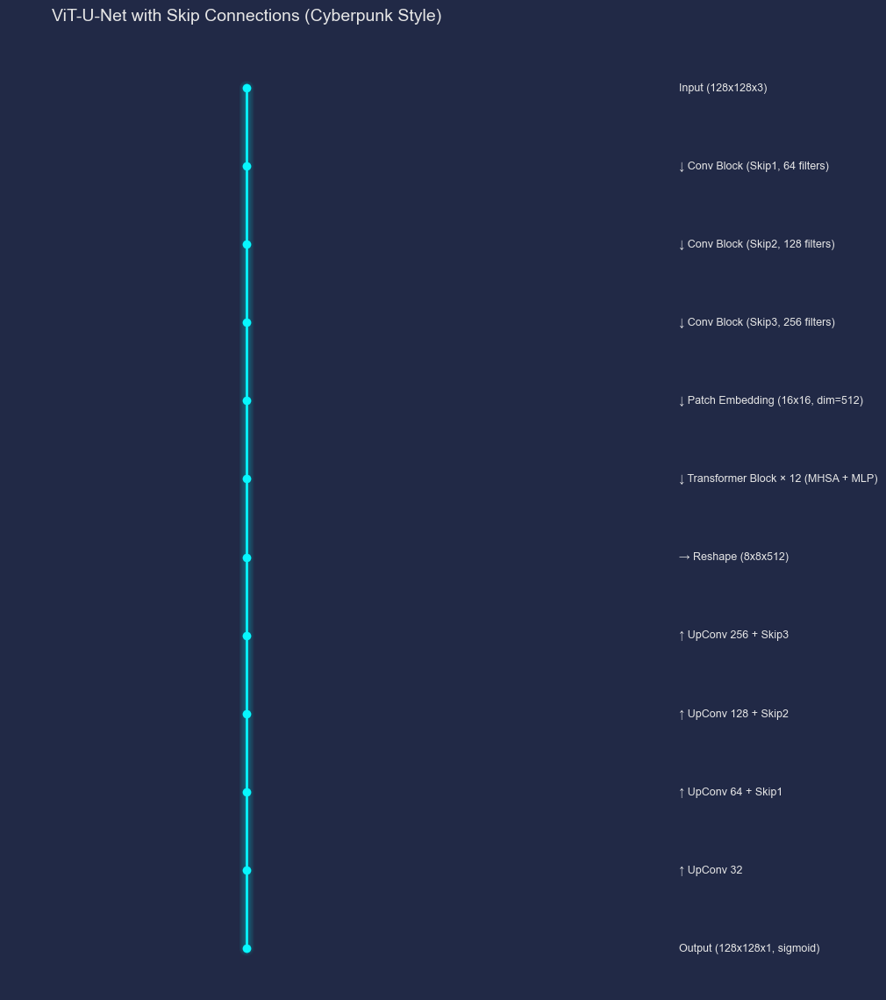

In [104]:
import matplotlib.pyplot as plt
import mplcyberpunk

def plot_vit_unet_cyberpunk():
    layers = [
        "Input (128x128x3)",
        "↓ Conv Block (Skip1, 64 filters)",
        "↓ Conv Block (Skip2, 128 filters)",
        "↓ Conv Block (Skip3, 256 filters)",
        "↓ Patch Embedding (16x16, dim=512)",
        "↓ Transformer Block × 12 (MHSA + MLP)",
        "→ Reshape (8x8x512)",
        "↑ UpConv 256 + Skip3",
        "↑ UpConv 128 + Skip2",
        "↑ UpConv 64 + Skip1",
        "↑ UpConv 32",
        "Output (128x128x1, sigmoid)"
    ]

    y = list(range(len(layers)))[::-1] 
    x = [0]*len(layers)

    plt.figure(figsize=(7, 14))
    plt.plot(x, y, marker="o", linewidth=2)

    for i, layer in enumerate(layers):
        plt.text(0.1, y[i], layer, fontsize=9, ha="left", va="center")

    plt.title("ViT-U-Net with Skip Connections (Cyberpunk Style)", fontsize=14, pad=20)
    plt.axis("off")

    plt.style.use("cyberpunk")
    mplcyberpunk.add_glow_effects()

    plt.show()

plot_vit_unet_cyberpunk()


In [105]:
model = vit_unet(
    input_size=(128,128,3),
    num_classes=1,
    patch_size=16,
    embed_dim=512,     
    num_heads=8,
    num_layers=12,
    mlp_dim=1024
)


In [106]:
model.compile(
    optimizer=Adam(1e-4),
    loss=bce_dice_loss,   # custom loss
    metrics=["accuracy", iou_metric, dice_coefficient]
)

In [107]:
IMG_SIZE = (128, 128)

class SegmentationDataGenerator(Sequence):
    def __init__(self, image_root, mask_root, batch_size=16):
        self.image_paths = []
        self.mask_paths = []
        self.batch_size = batch_size

        for subfolder in os.listdir(image_root):
            img_dir = os.path.join(image_root, subfolder)
            mask_dir = os.path.join(mask_root, subfolder)

            for fname in os.listdir(img_dir):
                self.image_paths.append(os.path.join(img_dir, fname))
                self.mask_paths.append(os.path.join(mask_dir, fname))

        self.indices = np.arange(len(self.image_paths))

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def __getitem__(self, idx):
        batch_idx = self.indices[idx*self.batch_size:(idx+1)*self.batch_size]
        X, y = [], []

        for i in batch_idx:
            # Image
            img = cv2.imread(self.image_paths[i])
            img = cv2.resize(img, IMG_SIZE).astype(np.float32)
            img = img / 255.0
             
            mask = cv2.imread(self.mask_paths[i], cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, IMG_SIZE, interpolation=cv2.INTER_NEAREST)
            mask = mask / 255.0
            mask = (mask > 0.5).astype(np.float32)
            mask = np.expand_dims(mask, axis=-1)

            X.append(img)
            y.append(mask)

        return np.array(X), np.array(y)


In [108]:
train_gen = SegmentationDataGenerator(
    image_root=os.path.join(data_dir, "train", "Original"),
    mask_root=os.path.join(data_dir, "train", "Segmented"),
    batch_size=16
)

val_gen = SegmentationDataGenerator(
    image_root=os.path.join(data_dir, "validation", "Original"),
    mask_root=os.path.join(data_dir, "validation", "Segmented"),
    batch_size=16
)

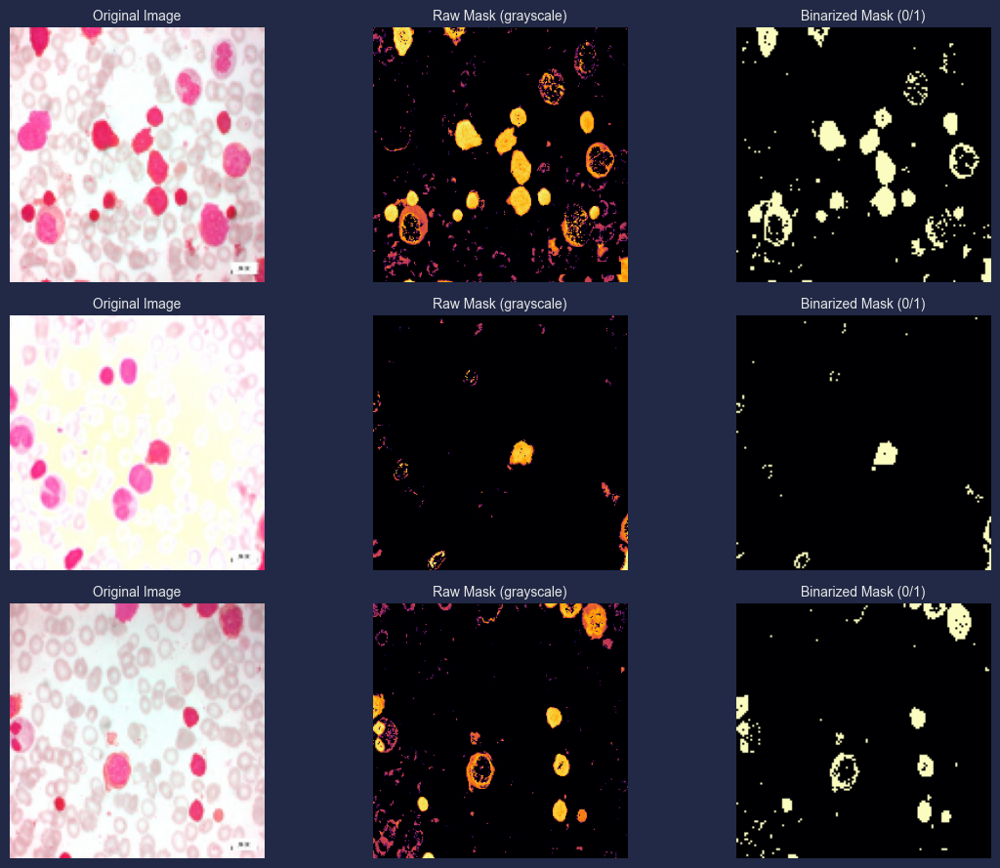

In [109]:
import matplotlib.pyplot as plt
import mplcyberpunk

def visualize_masks_cyberpunk(generator, n=3):
    X, y = generator[0]  # take first batch
    plt.style.use("cyberpunk")

    plt.figure(figsize=(12, n * 3))

    for i in range(n):
        img = X[i]
        raw_mask = cv2.imread(generator.mask_paths[i], cv2.IMREAD_GRAYSCALE)
        bin_mask = (y[i].squeeze() > 0.5).astype(np.float32)

        # Plot Original Image
        plt.subplot(n, 3, i*3 + 1)
        plt.imshow(img)
        plt.title("Original Image", fontsize=10)
        plt.axis("off")

        # Plot Raw Mask
        plt.subplot(n, 3, i*3 + 2)
        plt.imshow(raw_mask, cmap="inferno")
        plt.title("Raw Mask (grayscale)", fontsize=10)
        plt.axis("off")

        # Plot Binarized Mask
        plt.subplot(n, 3, i*3 + 3)
        plt.imshow(bin_mask, cmap="magma")
        plt.title("Binarized Mask (0/1)", fontsize=10)
        plt.axis("off")

    mplcyberpunk.add_glow_effects()
    plt.tight_layout()
    plt.show()

visualize_masks_cyberpunk(val_gen, n=3)


In [110]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=20
)


Epoch 1/20
143/143 [==============================] - 603s 4s/step - loss: 0.7264 - accuracy: 0.9005 - iou_metric: 0.0592 - dice_coefficient: 0.1091 - val_loss: 0.6755 - val_accuracy: 0.9216 - val_iou_metric: 0.0746 - val_dice_coefficient: 0.1354
Epoch 2/20
143/143 [==============================] - 586s 4s/step - loss: 0.4947 - accuracy: 0.9351 - iou_metric: 0.2502 - dice_coefficient: 0.3649 - val_loss: 0.3774 - val_accuracy: 0.9554 - val_iou_metric: 0.3814 - val_dice_coefficient: 0.5103
Epoch 3/20
143/143 [==============================] - 588s 4s/step - loss: 0.3519 - accuracy: 0.9547 - iou_metric: 0.4211 - dice_coefficient: 0.5492 - val_loss: 0.3302 - val_accuracy: 0.9605 - val_iou_metric: 0.4481 - val_dice_coefficient: 0.5708
Epoch 4/20
143/143 [==============================] - 586s 4s/step - loss: 0.3277 - accuracy: 0.9592 - iou_metric: 0.4591 - dice_coefficient: 0.5812 - val_loss: 0.3153 - val_accuracy: 0.9633 - val_iou_metric: 0.4738 - val_dice_coefficient: 0.5915
Epoch 5/20
1

1/1 [==============================] - 3s 3s/step


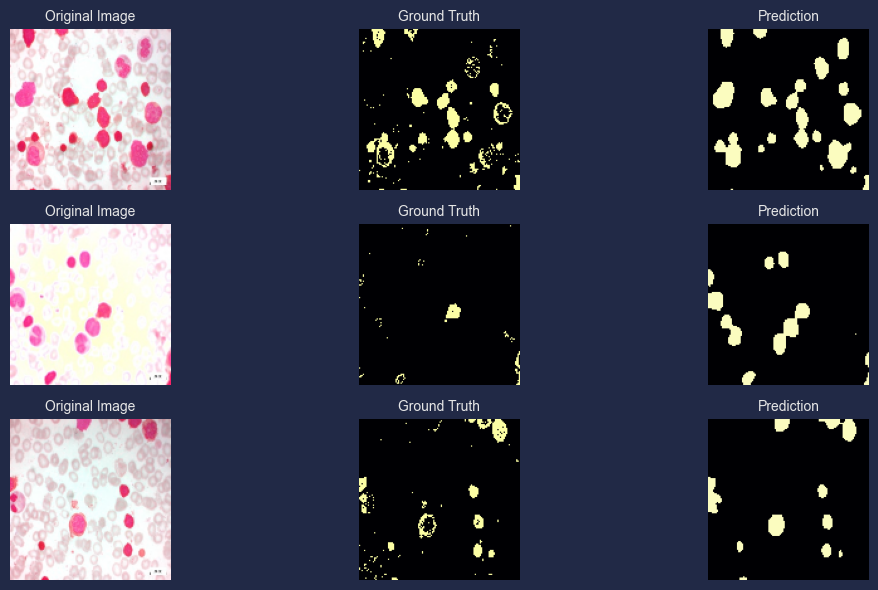

In [111]:
import matplotlib.pyplot as plt
import mplcyberpunk

# Take a batch from validation generator
X, y = val_gen[0]
preds = model.predict(X)

plt.style.use("cyberpunk")   # enable cyberpunk style

plt.figure(figsize=(12, 6))
for i in range(3):  # show 3 samples
    # Original Image
    plt.subplot(3, 3, i*3 + 1)
    plt.imshow(X[i])
    plt.title("Original Image", fontsize=10)
    plt.axis("off")

    # Ground Truth Mask
    plt.subplot(3, 3, i*3 + 2)
    plt.imshow(y[i].squeeze(), cmap="inferno")
    plt.title("Ground Truth", fontsize=10)
    plt.axis("off")

    # Predicted Mask
    plt.subplot(3, 3, i*3 + 3)
    plt.imshow((preds[i].squeeze() > 0.5).astype(np.uint8), cmap="magma")
    plt.title("Prediction", fontsize=10)
    plt.axis("off")

mplcyberpunk.add_glow_effects()
plt.tight_layout()
plt.show()


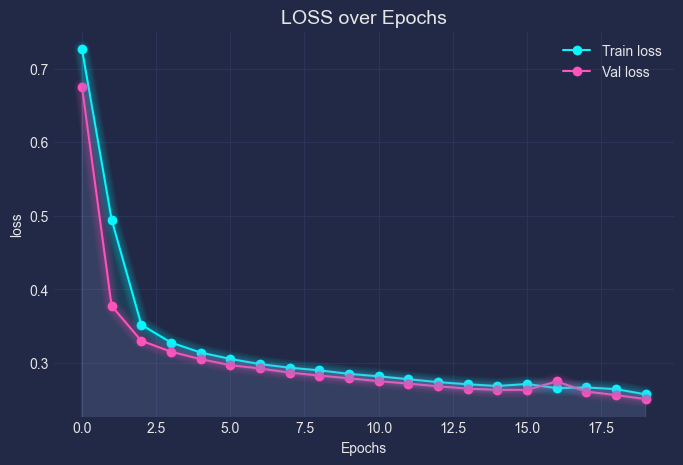

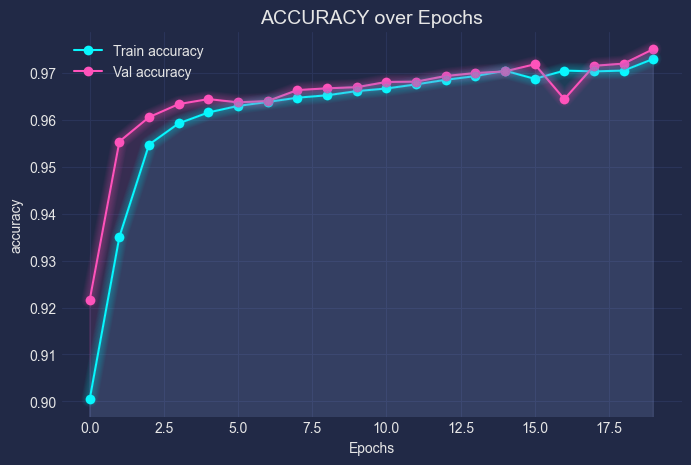

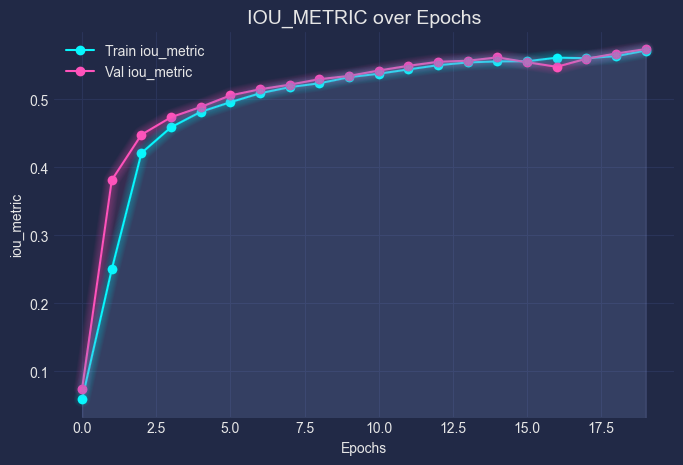

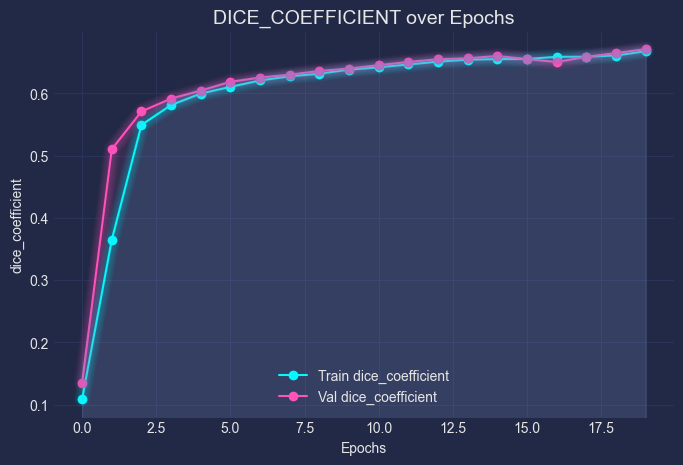

In [112]:
import matplotlib.pyplot as plt
import mplcyberpunk

def plot_training(history):
    plt.style.use("cyberpunk")
    metrics = ["loss", "accuracy", "iou_metric", "dice_coefficient"]

    for metric in metrics:
        plt.figure(figsize=(8,5))
        plt.plot(history.history[metric], label=f"Train {metric}", marker="o")
        plt.plot(history.history[f"val_{metric}"], label=f"Val {metric}", marker="o")
        plt.title(f"{metric.upper()} over Epochs", fontsize=14)
        plt.xlabel("Epochs")
        plt.ylabel(metric)
        plt.legend()
        mplcyberpunk.add_glow_effects()
        plt.show()

plot_training(history)


In [113]:
test_gen = SegmentationDataGenerator(
    image_root=os.path.join(data_dir, "test", "Original"),
    mask_root=os.path.join(data_dir, "test", "Segmented"),
    batch_size=16
)

results = model.evaluate(test_gen)
print("📊 Test Results:", dict(zip(model.metrics_names, results)))


31/31 [==============================] - 50s 2s/step - loss: 0.2451 - accuracy: 0.9742 - iou_metric: 0.5785 - dice_coefficient: 0.6805
📊 Test Results: {'loss': 0.2450571060180664, 'accuracy': 0.9741531014442444, 'iou_metric': 0.5784927010536194, 'dice_coefficient': 0.6805304884910583}


1/1 [==============================] - 2s 2s/step


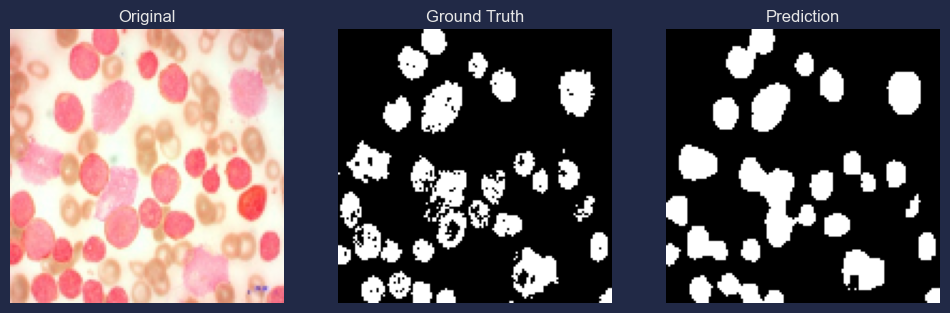

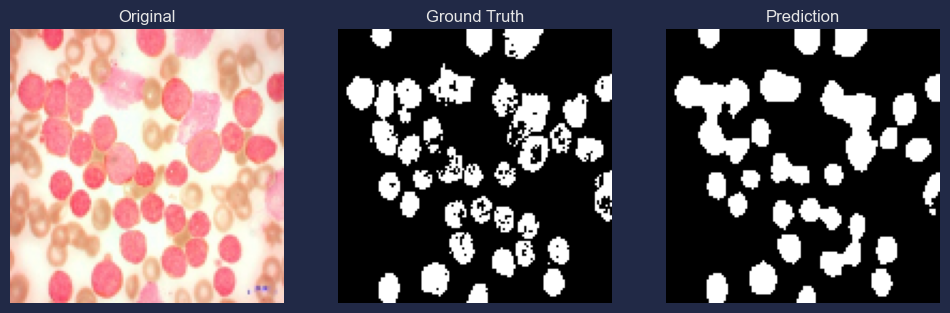

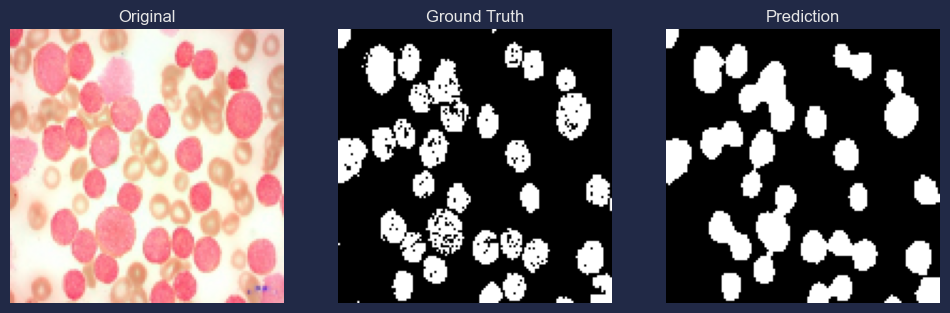

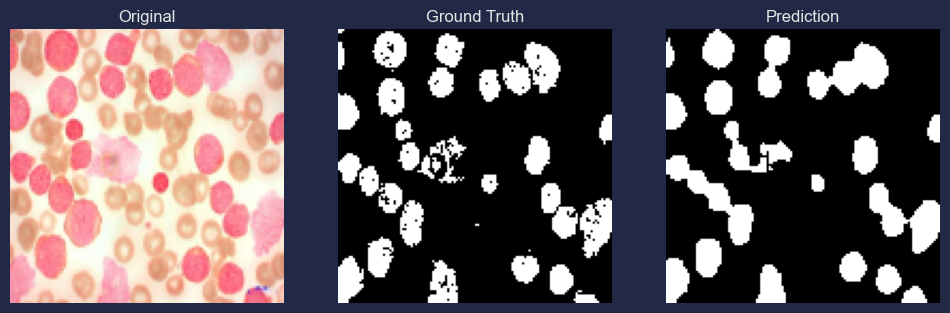

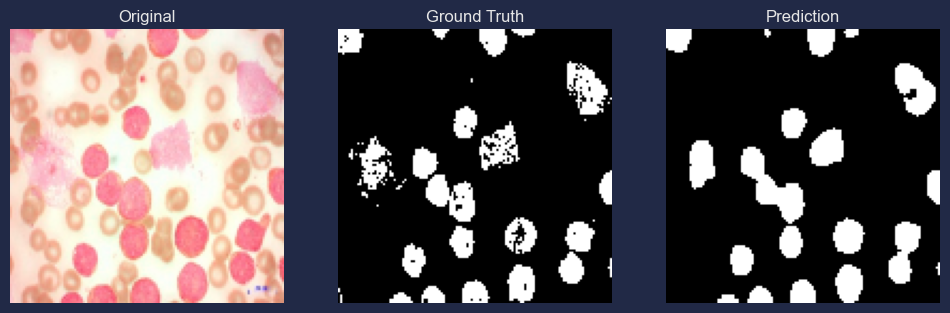

...

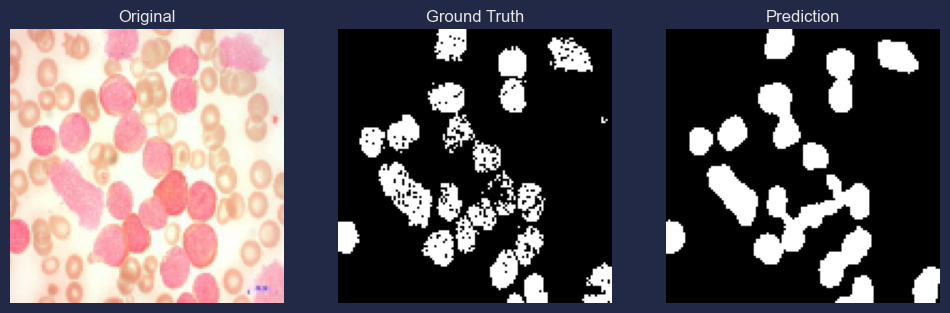

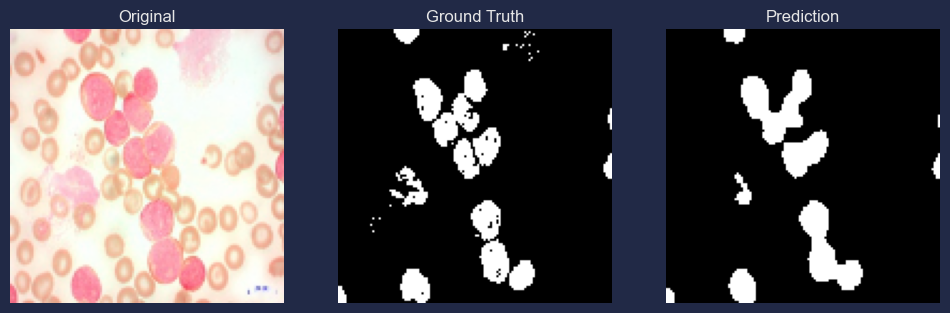

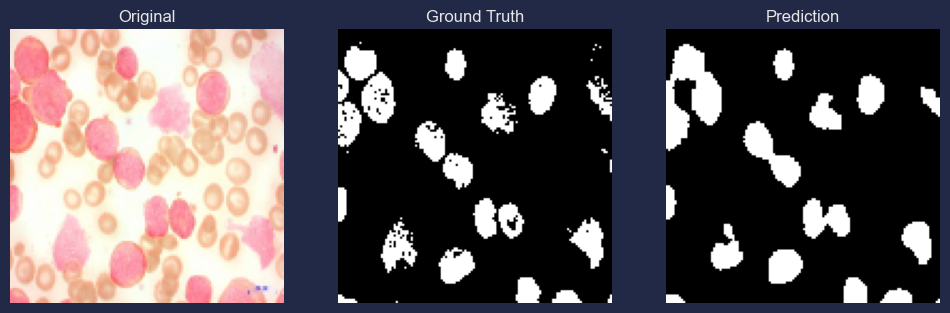

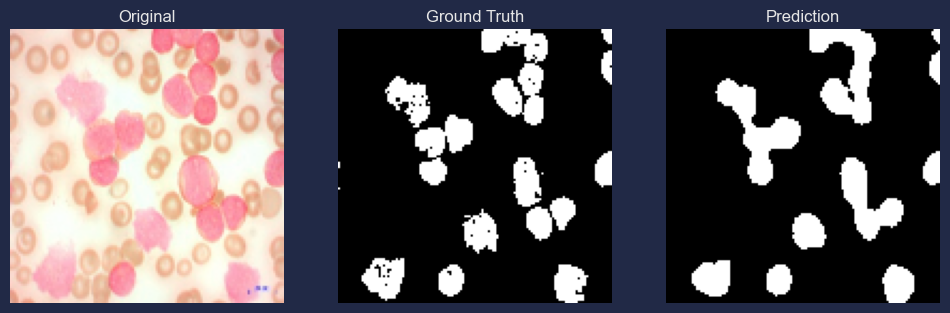

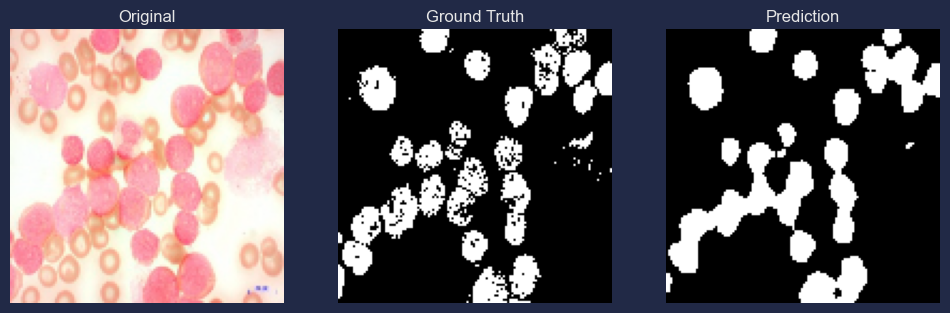

1/1 [==============================] - 1s 1s/step


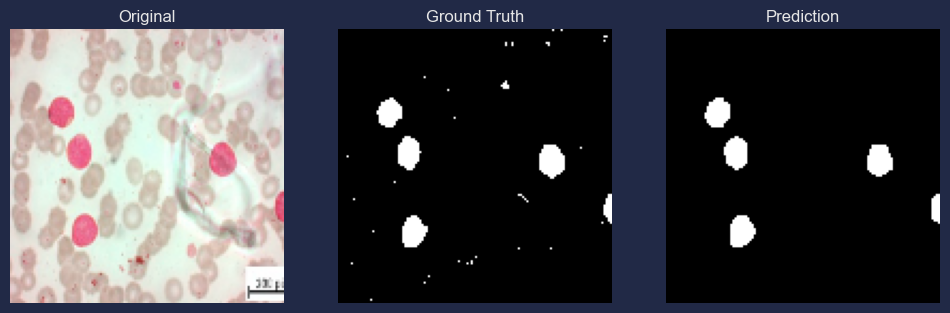

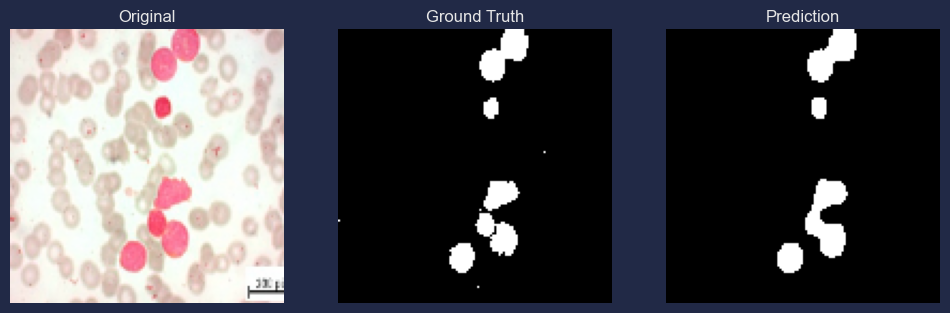

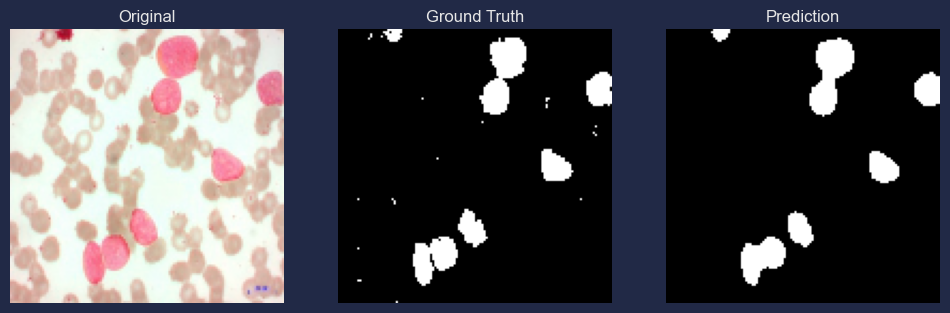

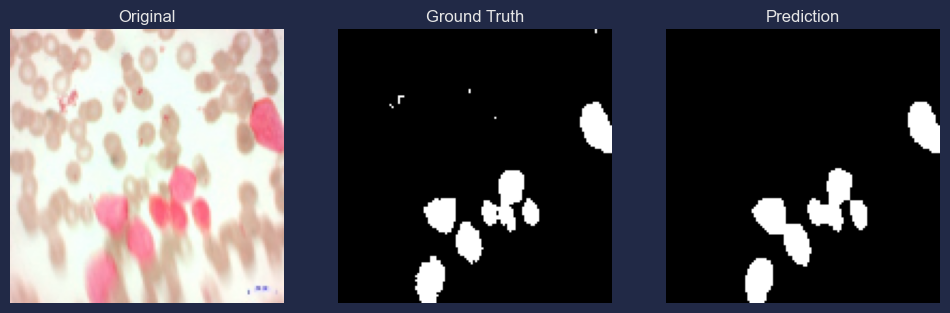

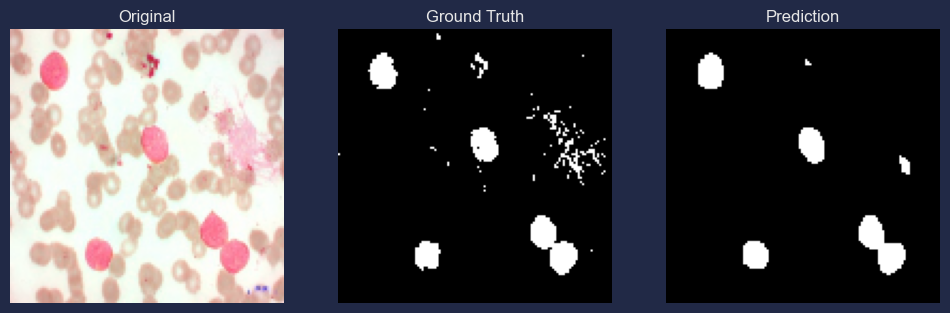

...

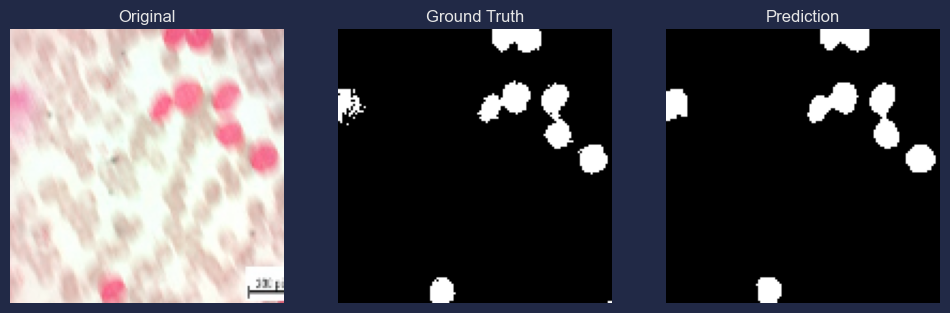

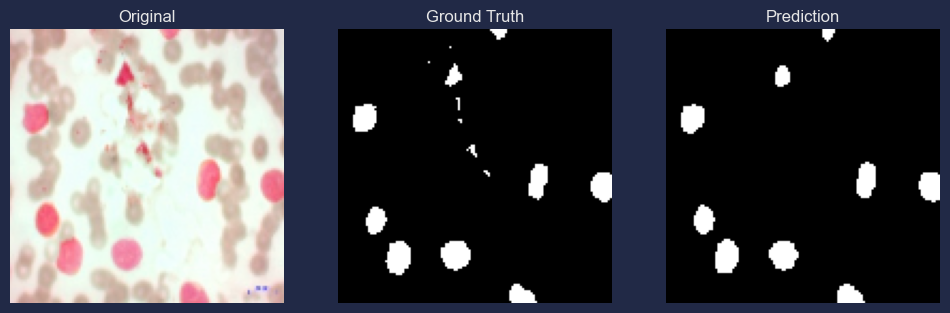

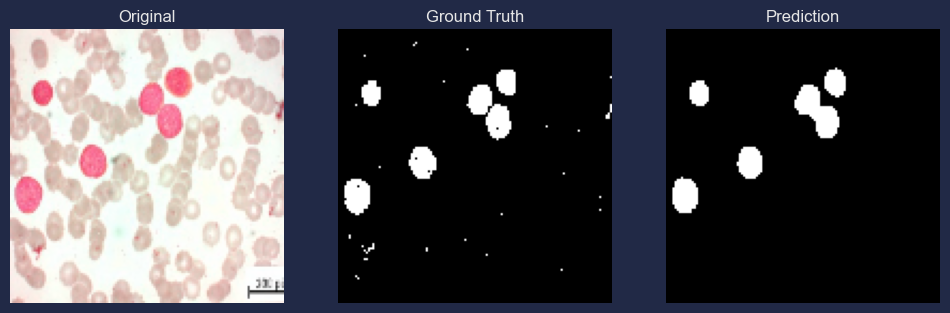

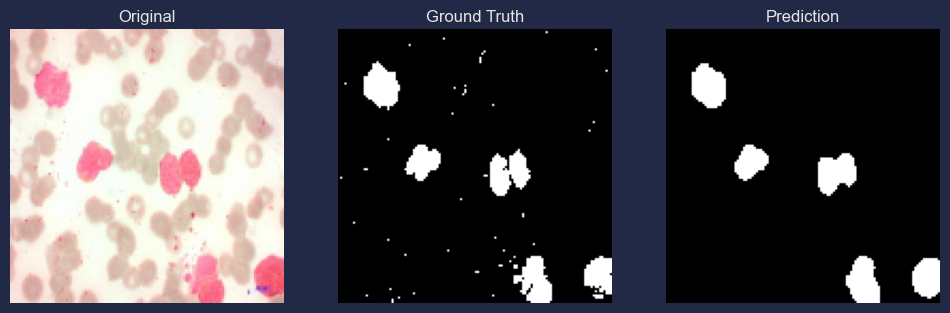

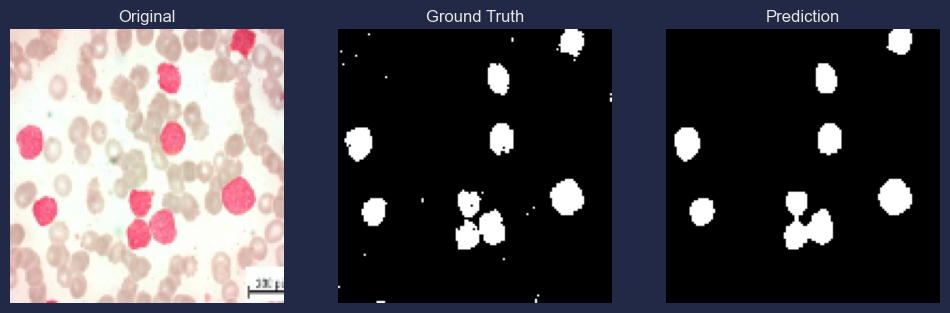

1/1 [==============================] - 2s 2s/step


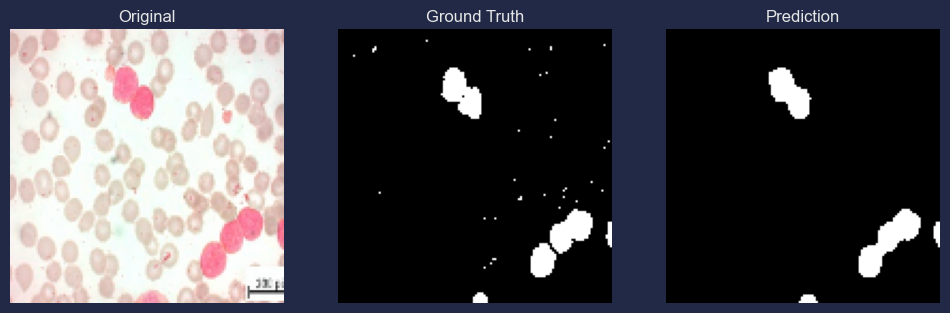

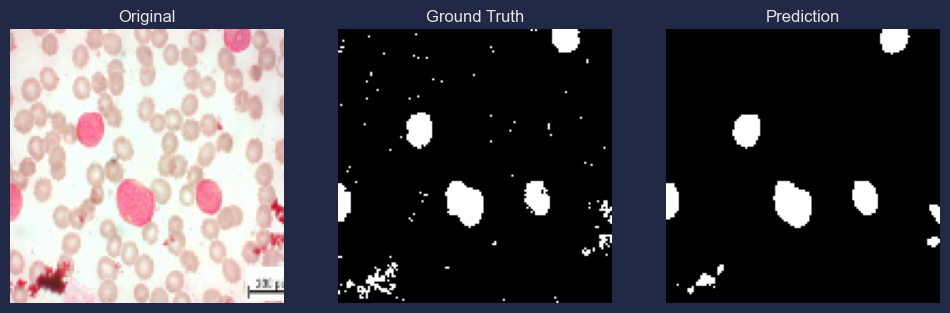

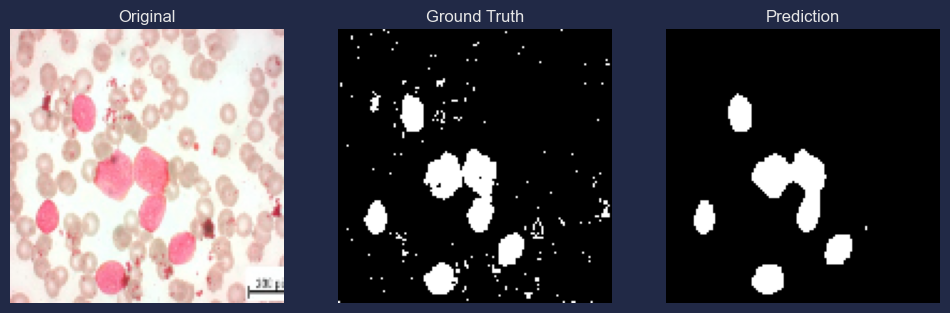

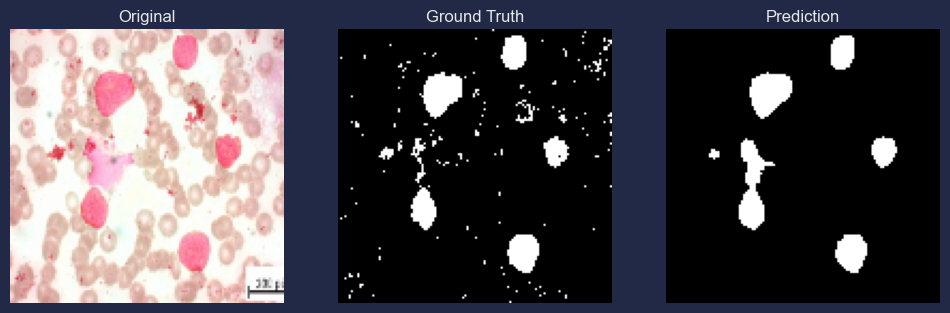

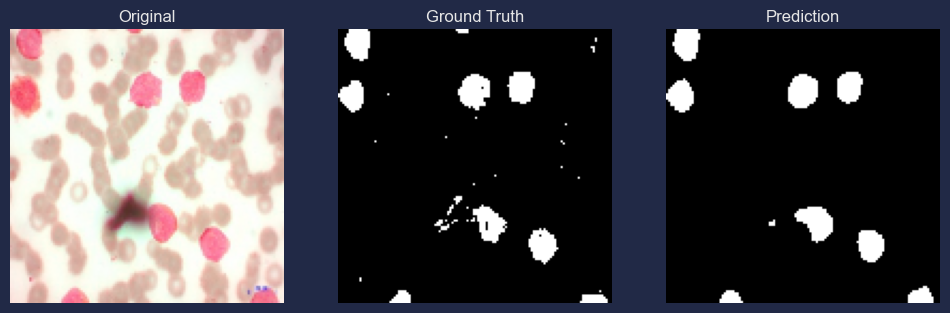

...

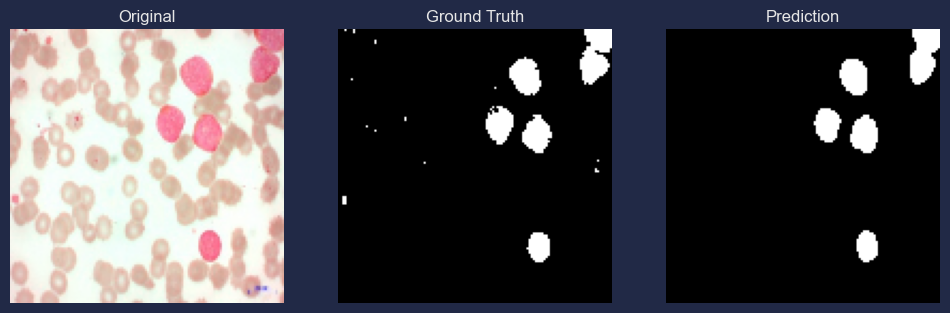

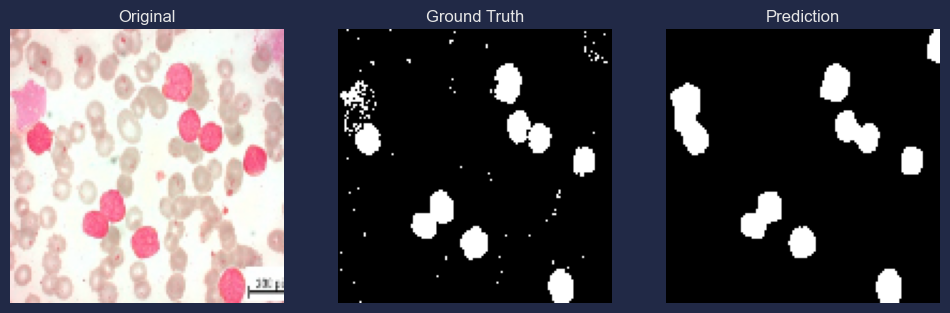

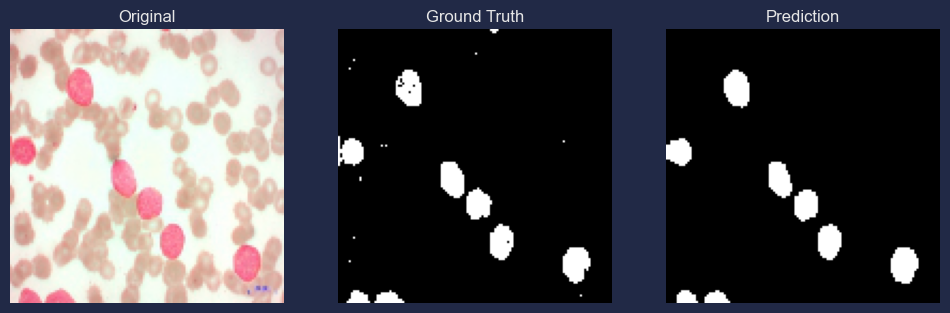

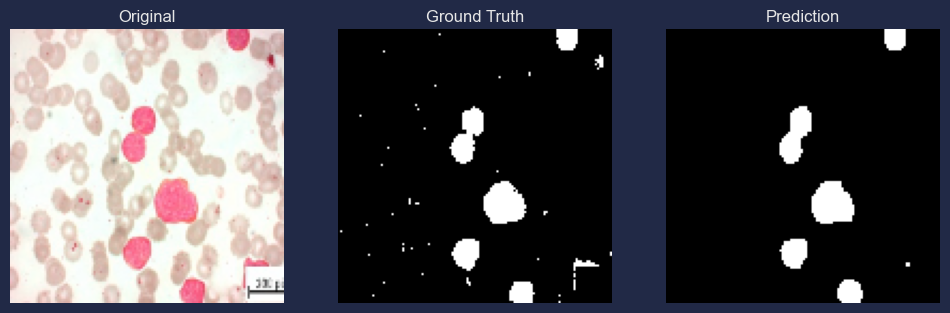

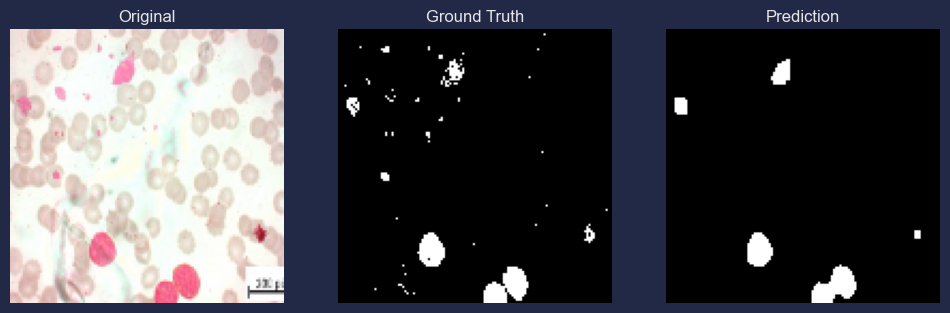

In [114]:
import random

def visualize_predictions(model, generator, num_samples=3):
    idxs = random.sample(range(len(generator)), num_samples)

    for idx in idxs:
        X, y_true = generator[idx]
        y_pred = model.predict(X)

        for i in range(len(X)):
            plt.figure(figsize=(12,4))

            # Original
            plt.subplot(1,3,1)
            plt.imshow(X[i])
            plt.title("Original")
            plt.axis("off")

            # Ground Truth
            plt.subplot(1,3,2)
            plt.imshow(y_true[i].squeeze(), cmap="gray")
            plt.title("Ground Truth")
            plt.axis("off")

            # Prediction
            plt.subplot(1,3,3)
            plt.imshow(y_pred[i].squeeze() > 0.5, cmap="gray")
            plt.title("Prediction")
            plt.axis("off")

            plt.show()


visualize_predictions(model, test_gen)

In [115]:
import json

with open("seg_all_vit_history.json", "w") as f:
    json.dump(history.history, f)



In [117]:
import pandas as pd

# Convert to DataFrame
history_df = pd.DataFrame(history.history)

# Save as CSV
history_df.to_csv("seg_all_vit_history.csv", index=False)

In [118]:
import pandas as pd
import os


ckpt_dir = r"C:\Users\Lenovo\Desktop\Exploration-of-ViT-and-CNN-for-Medical-Image-Processing\checkpoints\segmentation"
os.makedirs(ckpt_dir, exist_ok=True)

history_df = pd.DataFrame(history.history)
csv_path = os.path.join(ckpt_dir, "seg_all_vit_history.csv")
history_df.to_csv(csv_path, index=False)

print(f"✅ Training history saved at {csv_path}")


✅ Training history saved at C:\Users\Lenovo\Desktop\Exploration-of-ViT-and-CNN-for-Medical-Image-Processing\checkpoints\segmentation\seg_all_vit_history.csv


In [119]:
# Save weights
weights_path = os.path.join(ckpt_dir, "seg_all_vit_model.pt")
model.save_weights(weights_path)

print(f"✅ Model weights saved at {weights_path}")


✅ Model weights saved at C:\Users\Lenovo\Desktop\Exploration-of-ViT-and-CNN-for-Medical-Image-Processing\checkpoints\segmentation\seg_all_vit_model.pt


In [121]:
model.save_weights("seg_all_vit_model.h5")